In [1]:
import os
import sys
import shlex
import subprocess
import numpy as np
from astropy.io import ascii
from astropy.io import fits
from astroscrappy import detect_cosmics
from math import sqrt
from skimage import color, morphology
from skimage.feature import canny, blob_dog, blob_log, blob_doh
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line
from skimage.filters import sobel
from scipy import ndimage, stats, interpolate, signal
from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from pylab import *
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import time
#import cv2

inline_rc = dict(mpl.rcParams)
matplotlib.rcParams['figure.figsize'] = (10.0, 8.0)

/usr/local/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [70]:
def imtoasinh(im_data):
    asinh_percentile=[0.25,99.5]
    asinh_midpoint=-0.07

    im_gray=im_data.copy()
    im_gray = np.nan_to_num(im_gray)
    im_gray_percentile=np.percentile(im_gray,asinh_percentile)
    im_gray_min=im_gray_percentile[0]
    im_gray_max=im_gray_percentile[1]

    print "FITS image - min=%.2f  max=%.2f" % (im_gray_min, im_gray_max)

    im_gray=(im_gray-im_gray_min)/(im_gray_max-im_gray_min)
    im_gray=np.arcsinh(im_gray/asinh_midpoint)/np.arcsinh(1./asinh_midpoint)
    im_gray = np.nan_to_num(im_gray)
    im_gray = np.clip(im_gray, 0., 1.)
    
    return im_gray

def median_filter(im_data, im_mask, kernel_size=7):
    im_data = im_data.copy()
    im_data[im_mask] = np.nan
    
    kernel = np.ones((kernel_size,kernel_size), bool)
    kernel[(kernel_size-1)/2-1:(kernel_size-1)/2+2,(kernel_size-1)/2-1:(kernel_size-1)/2+2]=False
        
    ny, nx = im_data.shape
    nim_data = np.zeros((ny,nx))
    for i in range((kernel_size-1)/2,ny-(kernel_size-1)/2):
        for j in range((kernel_size-1)/2,nx-(kernel_size-1)/2):
            nim_data[i,j] = np.nanmedian(im_data[i-(kernel_size-1)/2:i+(kernel_size-1)/2+1, j-(kernel_size-1)/2:j+(kernel_size-1)/2+1][kernel])
            
    return nim_data
            
def median_interpolate(im_data, im_mask, inter_type='cubic', inter_width=64, grid_sampling=10):
    ny, nx = im_data.shape
    im_data = im_data.copy()
    im_data[im_mask] = np.nan
  
    y=0
    xx=[]
    yy=[]
    zz=[]
    while y < ny:
        y_width=inter_width
        if y+y_width > ny: y_width = ny-y
        x=0
        while x < nx:
            x_width=inter_width
            if x+x_width > nx: x_width = nx-x
            xx.append(int(x+x_width/2))
            yy.append(int(y+y_width/2))
            gv=np.isfinite(im_data[y:y+y_width,x:x+x_width])
            if np.sum(gv)*1./(x_width*y_width) > 0.7:
                zz.append(np.nanmedian(im_data[y:y+y_width,x:x+x_width],axis=None))
            else:
                zz.append(np.nan)
            x+=x_width
        y+=y_width

    xx = np.array(xx)
    yy = np.array(yy)
    zz = np.array(zz)

    start_time = time.time()
    gv=np.isfinite(zz)
    if inter_type=='cubic':
        print "GridData cubic interpolation - STARTING"
        grid_x, grid_y = np.meshgrid(np.arange(0,nx,grid_sampling), np.arange(0,ny,grid_sampling))
        im_model_data=interpolate.griddata(np.stack((xx[gv],yy[gv]),axis=-1), zz[gv], (grid_x, grid_y), method='cubic',fill_value=0.) 
    elif inter_type=='inverse':
        print "RBF inverse interpolation - STARTING"
        grid_x, grid_y = np.meshgrid(np.arange(0,nx,grid_sampling), np.arange(0,ny,grid_sampling))
        rbf_model = interpolate.Rbf(xx[gv],yy[gv],zz[gv],function='inverse')
        im_model_data = rbf_model(grid_x,grid_y)
    elif inter_type=='multiquadric':
        print "RBF inverse interpolation - STARTING"
        grid_x, grid_y = np.meshgrid(np.arange(0,nx,grid_sampling), np.arange(0,ny,grid_sampling))
        rbf_model = interpolate.Rbf(xx[gv],yy[gv],zz[gv],function='multiquadric', epsilon=100)
        im_model_data = rbf_model(grid_x,grid_y)
    elif inter_type=='tps':
        print "RBF tps interpolation - STARTING"
        grid_x, grid_y = np.meshgrid(np.arange(0,nx,grid_sampling), np.arange(0,ny,grid_sampling))
        rbf_model = interpolate.Rbf(xx[gv],yy[gv],zz[gv],function='thin_plate')
        im_model_data = rbf_model(grid_x,grid_y)
        
    print "Interpolation done"
    print "Total execution time: %.1f minutes" % ((time.time() - start_time)/60.)

#    gv_nan=np.isnan(im_data)
#    if np.sum(gv_nan)>0:
#        nim_data[gv_nan]=nim_model_data[gv_nan]       
    im_data=np.nan_to_num(im_data)
    
    return im_data, im_model_data

In [3]:
im_file='vcc1010flux.fits'
im_h = fits.getheader(im_file,0)
im_data =  fits.getdata(im_file,0)
im_size = np.shape(im_data)

print 'Science image - median: ', "{:.2f}".format(np.median(im_data))
print 'Science image - stddev: ', "{:.2f}".format(np.std(im_data))
print 'Low percentile: ', "{:.2f}".format(np.percentile(im_data, 0.25))
print 'High percentile: ', "{:.2f}".format(np.percentile(im_data, 99.5))
print 'Science image - min: ', "{:.2f}".format(np.min(im_data))
print 'Science image - max: ', "{:.2f}".format(np.max(im_data))

Science image - median:  0.49
Science image - stddev:  82.69
Low percentile:  -1.36
High percentile:  76.71
Science image - min:  -444.91
Science image - max:  3188.03


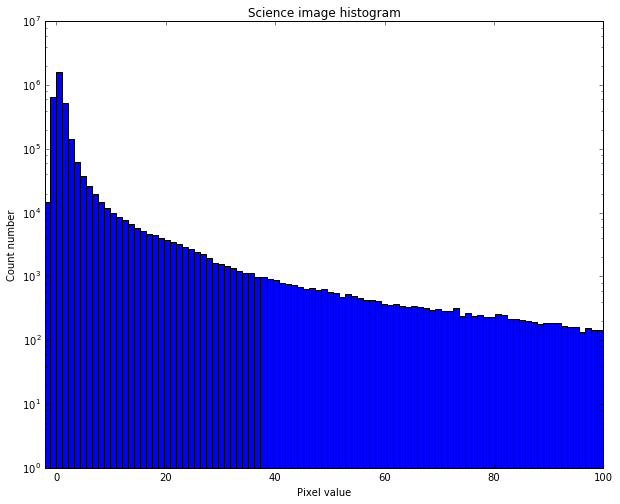

In [4]:
plt.hist(np.ndarray.flatten(im_data), bins=100, range=(-10.,100.))
plt.xlim(-2.,100.)
plt.ticklabel_format(useOffset=False)
plt.yscale('log')
plt.title('Science image histogram')
plt.xlabel('Pixel value')
plt.ylabel('Count number')

In [5]:
im_median=np.median(im_data)
im_stddev=np.std(im_data[(im_data>-10) & (im_data<20)])

print 'Science image - median: ', "{:.2f}".format(im_median)
print 'Science image - stddev: ', "{:.2f}".format(im_stddev)

Science image - median:  0.49
Science image - stddev:  2.30


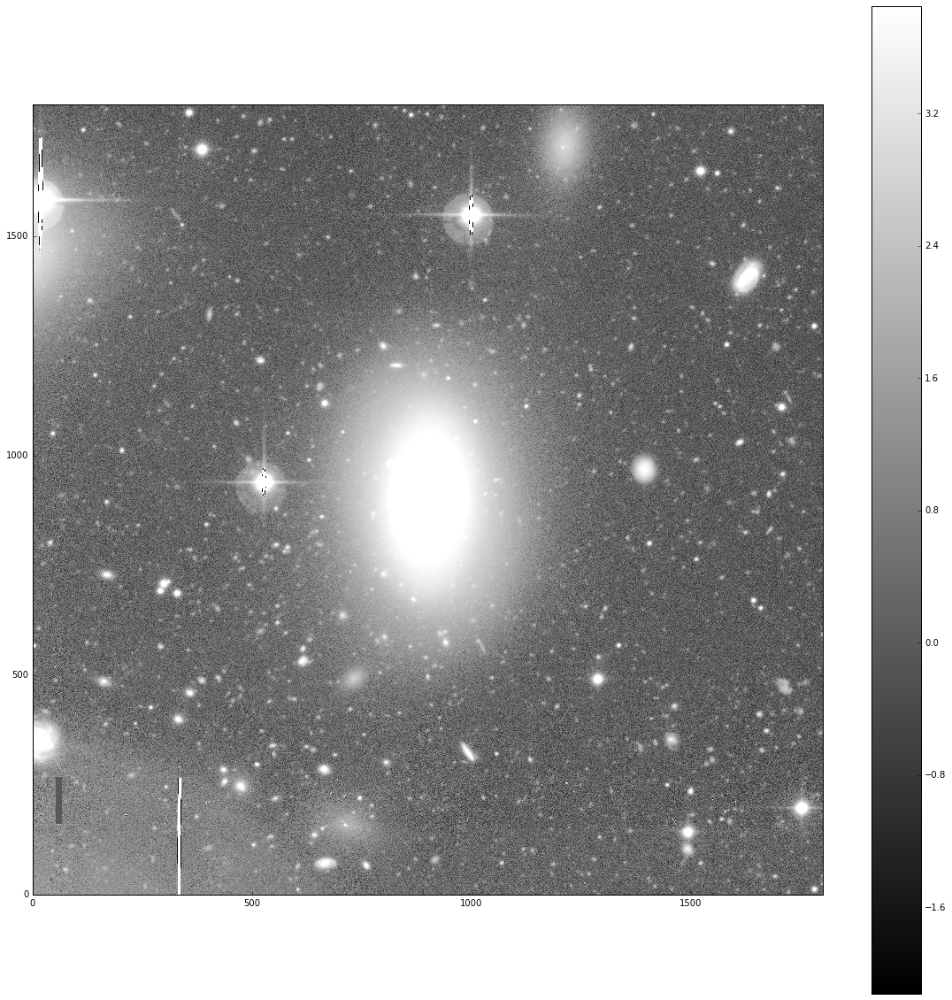

In [6]:
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(np.arcsinh(im_data),cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=np.arcsinh(im_median-2*im_stddev), vmax=np.arcsinh(im_median+10*im_stddev))
fig.colorbar(im)
plt.show()

FITS image - min=-1.36  max=76.71
FITS converted image - min=0.00  max=1.00
(1800, 1800)


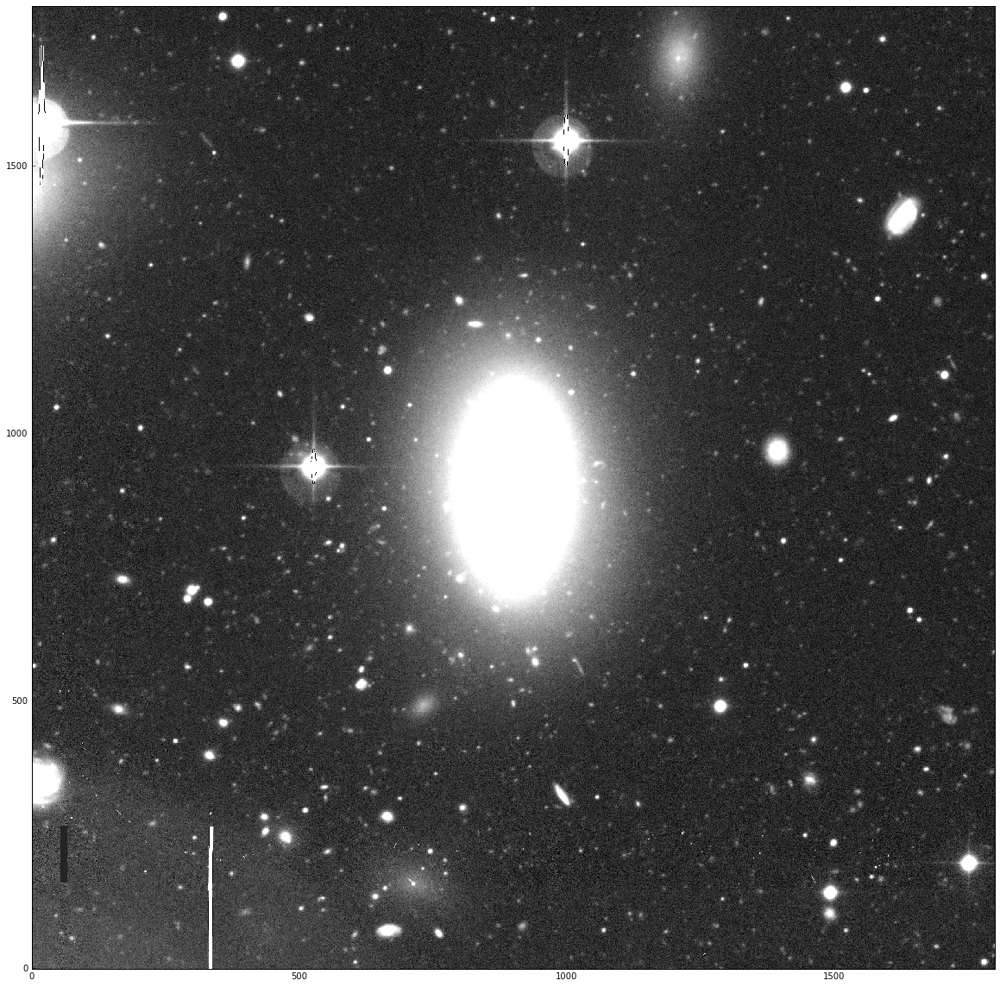

In [59]:
im_gray = imtoasinh(im_data)

im_gray_min=np.min(im_gray)
im_gray_max=np.max(im_gray)
print "FITS converted image - min=%.2f  max=%.2f" % (im_gray_min, im_gray_max)
print np.shape(im_gray)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(im_gray, plt.get_cmap('gray'), interpolation='nearest', origin='lower', vmin=0., vmax=0.5)
plt.show()

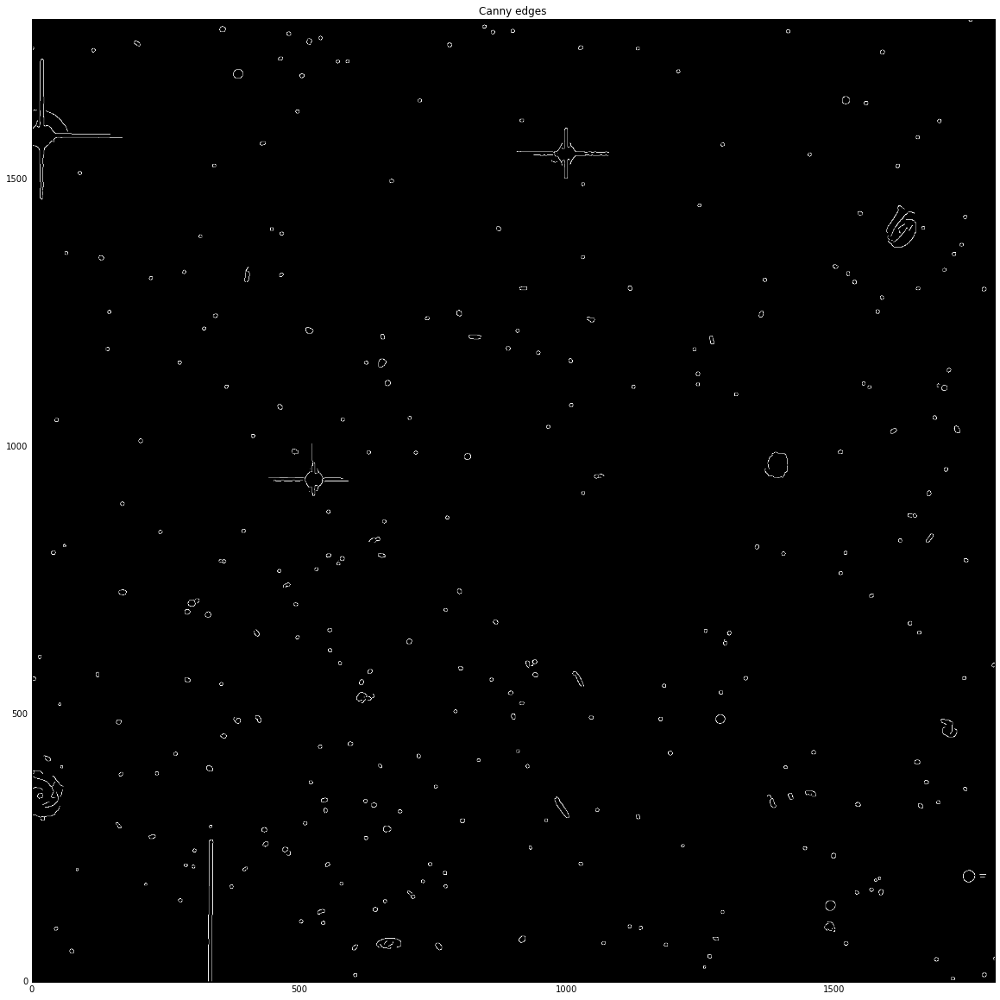

In [60]:
edges = canny(im_gray, sigma=2.)
#fill_sources = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(edges, cmap=cm.gray, origin='lower', interpolation='bilinear')
ax.set_title('Canny edges')
plt.show()

#fig, ax = plt.subplots()
#ax.imshow(fill_sources, cmap=cm.gray, origin='lower', interpolation='bilinear')
#ax.set_title('Canny edges')
#plt.show()

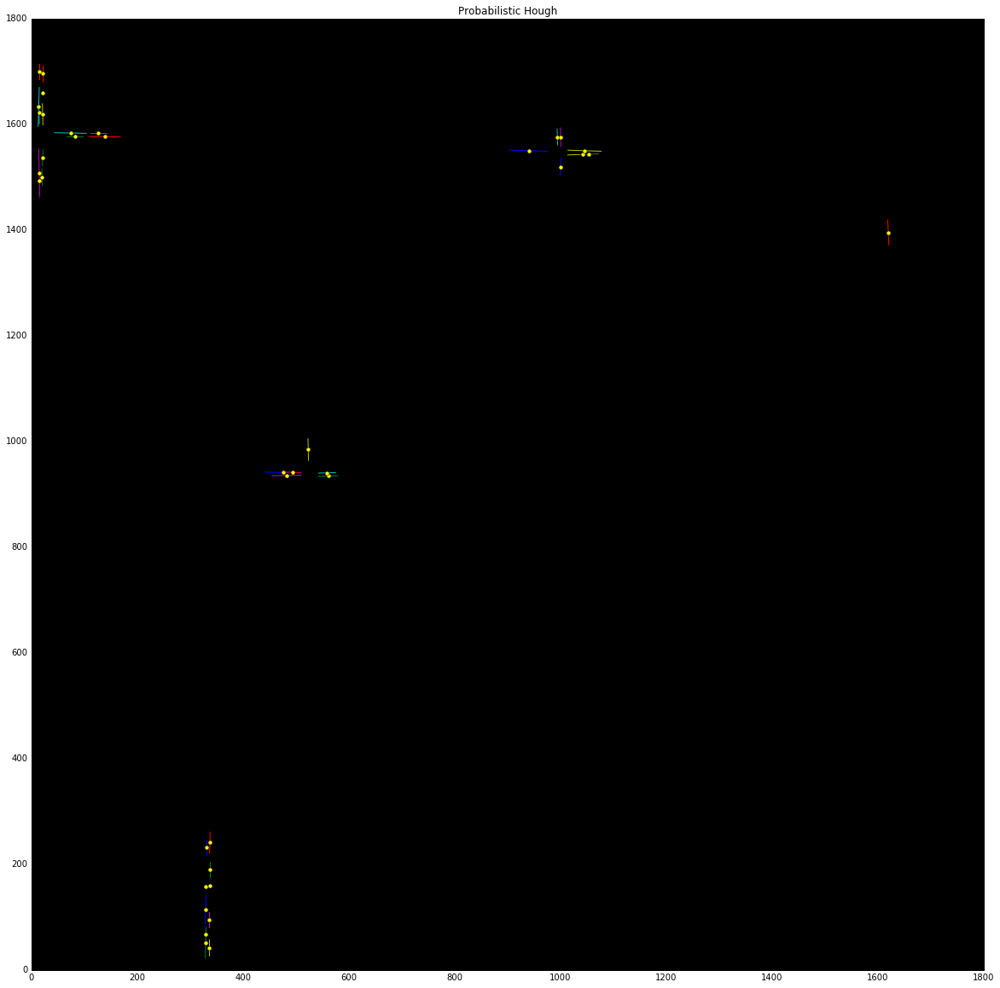

In [61]:
lines_y = probabilistic_hough_line(edges, threshold=30, line_length=30, line_gap=20, theta=np.array([-np.pi/100,np.pi/100]))
lines_x = probabilistic_hough_line(edges, threshold=30, line_length=30, line_gap=20, theta=np.array([np.pi/2-np.pi/100,np.pi/2+np.pi/100]))
lines=lines_x+lines_y

matplotlib.rcParams['figure.figsize'] = (20.0, 20.0)
fig, ax = plt.subplots()
ax.imshow(edges * 0, cmap=cm.gray, origin='lower')
lines_center_x=0.
lines_center_y=0.
lines_minmax_x=0.
lines_minmax_y=0.
for line in lines_x:
    p0, p1 = line
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]))
    try:
        lines_center_x=np.concatenate((lines_center_x,[[np.mean([p0[0], p1[0]]),np.mean([p0[1], p1[1]]),0]]),axis=0)
        lines_minmax_x=np.concatenate((lines_minmax_x,[[np.min([p0[0], p1[0]]),np.max([p0[0], p1[0]]),0]]),axis=0)
    except:
        lines_center_x=np.array([[np.mean([p0[0], p1[0]]),np.mean([p0[1], p1[1]]),0]])
        lines_minmax_x=np.array([[np.min([p0[0], p1[0]]),np.max([p0[0], p1[0]]),0]])
ax.plot(lines_center_x[:,0],lines_center_x[:,1],marker='o', markersize=5, linestyle='None', color='yellow')    

for line in lines_y:
    p0, p1 = line
    ax.plot((p0[0], p1[0]), (p0[1], p1[1]))
    try:
        lines_center_y=np.concatenate((lines_center_y,[[np.mean([p0[0], p1[0]]),np.mean([p0[1], p1[1]]),1]]),axis=0)
        lines_minmax_y=np.concatenate((lines_minmax_y,[[np.min([p0[1], p1[1]]),np.max([p0[1], p1[1]]),1]]),axis=0)
    except:
        lines_center_y=np.array([[np.mean([p0[0], p1[0]]),np.mean([p0[1], p1[1]]),1]])
        lines_minmax_y=np.array([[np.min([p0[1], p1[1]]),np.max([p0[1], p1[1]]),1]])       
ax.plot(lines_center_y[:,0],lines_center_y[:,1],marker='o', markersize=5, linestyle='None', color='yellow')    


lines_center=np.concatenate((lines_center_x,lines_center_y), axis=0)
lines_minmax=np.concatenate((lines_minmax_x,lines_minmax_y), axis=0)
ax.set_title('Probabilistic Hough')
row, col = np.shape(im_data)
ax.axis((0, col, 0, row))
plt.show()

In [62]:
af = AffinityPropagation(affinity="euclidean").fit(lines_center[:,0:2])
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters = len(cluster_centers_indices)
cluster_center=np.zeros((n_clusters,2))
cluster_limit=np.zeros((n_clusters,4))
cluster_radius=np.zeros((n_clusters,2))
print('Estimated number of clusters: %d' % n_clusters)

for i in range(n_clusters):
    class_members = labels == i

    gv=(lines_center[class_members, 2]==0)
    if np.sum(gv)>0:
        cluster_center[i,1]=np.median(lines_center[class_members,1][gv])
        gv_limit=np.abs(lines_center[class_members,1][gv]-cluster_center[i,1])<100
#        print gv_limit
        cluster_limit[i,0:2]=[np.min(lines_minmax[class_members,0][gv][gv_limit]),np.max(lines_minmax[class_members,1][gv][gv_limit])]
    else:
        cluster_center[i,1]=np.nan
        cluster_limit[i,0:2]=[np.nan,np.nan]

    gv=(lines_center[class_members, 2]==1)
    if np.sum(gv)>0:
        cluster_center[i,0]=np.median(lines_center[class_members,0][gv])
        gv_limit=np.abs(lines_center[class_members,0][gv]-cluster_center[i,0])<100
#        print gv_limit
        cluster_limit[i,2:4]=[np.min(lines_minmax[class_members,0][gv][gv_limit]),np.max(lines_minmax[class_members,1][gv][gv_limit])]
    else:
        cluster_center[i,0]=np.nan
        cluster_limit[i,2:4]=[np.nan,np.nan]

    if np.isfinite(cluster_center[i,0]) & np.isfinite(cluster_center[i,1]):
        cluster_radius[i,1]=np.max(np.abs([cluster_limit[i,2]-cluster_center[i,1],cluster_limit[i,3]-cluster_center[i,1]]))
        cluster_radius[i,0]=np.max(np.abs([cluster_limit[i,0]-cluster_center[i,0],cluster_limit[i,1]-cluster_center[i,0]]))
    elif np.isfinite(cluster_center[i,0]):
        cluster_center[i,1]=np.mean(cluster_limit[i,2:4])
        cluster_radius[i,1]=np.abs(cluster_limit[i,3]-cluster_limit[i,2])/2.
    elif np.isfinite(cluster_center[i,1]):
        cluster_center[i,0]=np.mean(cluster_limit[i,0:2])
        cluster_radius[i,0]=np.abs(cluster_limit[i,1]-cluster_limit[i,0])/2.
        
print "Cluster center\n", cluster_center
print "Cluster radius\n", cluster_radius
#print "Cluster limits\n", cluster_limit
#    print lines_center[class_members, 0], lines_center[class_members, 1]
#    cluster_center = lines_center[cluster_centers_indices[i]]
#    print "Cluster center: ", cluster_center

Estimated number of clusters: 4
Cluster center
[[   17.75  1580.  ]
 [ 1000.5   1546.75]
 [  523.5    940.5 ]
 [  333.5    142.  ]]
Cluster radius
[[ 150.25  135.  ]
 [  94.5    46.25]
 [  81.5    64.5 ]
 [   0.    119.  ]]


/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:12: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


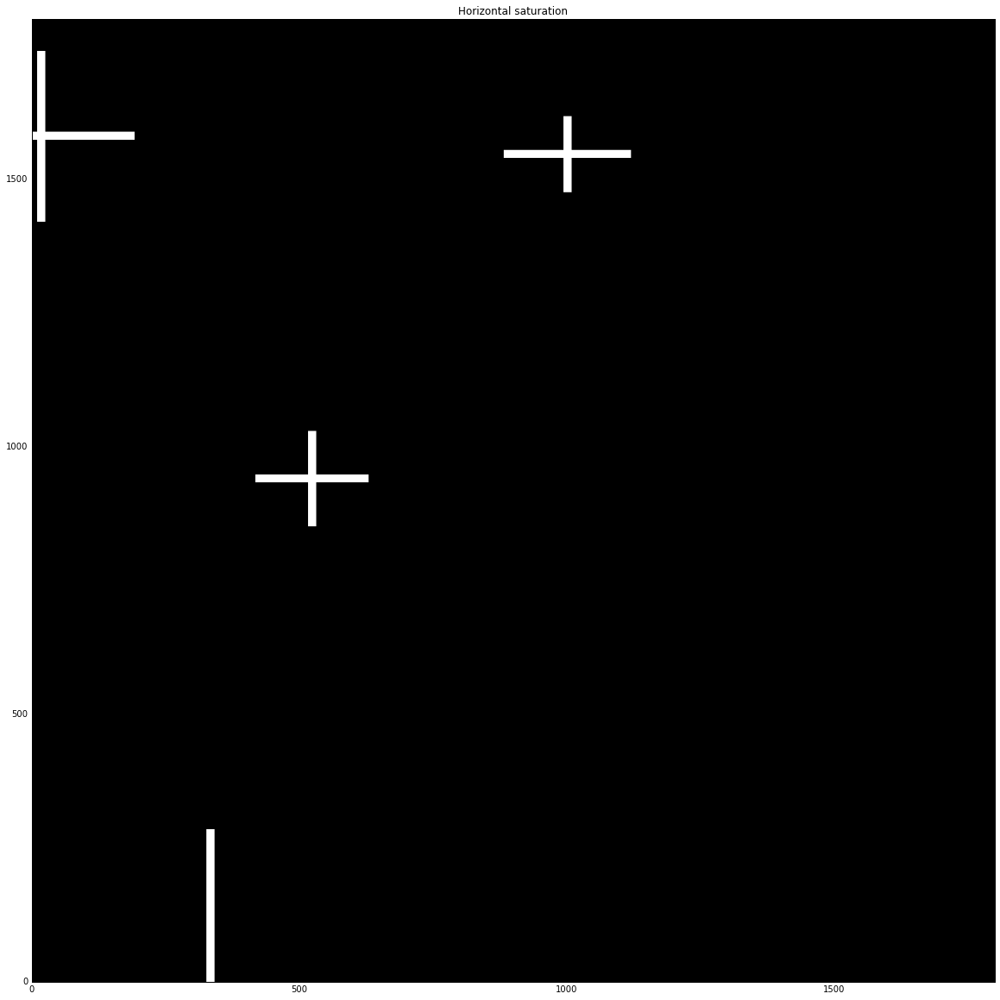

In [68]:
im_satur_x=np.zeros(im_size)
im_satur_y=np.zeros(im_size)
im_satur_width=15
im_satur_border=50

for i in range(n_clusters):
    im_satur_x[cluster_center[i,1],np.max([cluster_center[i,0]-cluster_radius[i,0],0]):np.min([cluster_center[i,0]+cluster_radius[i,0],im_size[1]])]=1
im_satur_x=ndimage.binary_dilation(im_satur_x,np.ones((im_satur_width, 1), dtype=bool)).astype(im_satur_x.dtype)
im_satur_x=ndimage.binary_dilation(im_satur_x,np.ones((1,im_satur_border), dtype=bool)).astype(im_satur_x.dtype)

for i in range(n_clusters):
    im_satur_y[np.max([cluster_center[i,1]-cluster_radius[i,1],0]):np.min([cluster_center[i,1]+cluster_radius[i,1],im_size[0]]),cluster_center[i,0]]=1
im_satur_y=ndimage.binary_dilation(im_satur_y,np.ones((1,im_satur_width), dtype=bool)).astype(im_satur_y.dtype)
im_satur_y=ndimage.binary_dilation(im_satur_y,np.ones((im_satur_border, 1), dtype=bool)).astype(im_satur_y.dtype)

mask_satur=np.logical_or(im_satur_x,im_satur_y)
#im_satur[im_satur>1.]=1.
#mask_satur=(im_satur>0.)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(mask_satur.astype(int), cmap=cm.gray, origin='lower', interpolation='bilinear')
ax.set_title('Horizontal saturation')
plt.show()

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in greater_equal
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in less


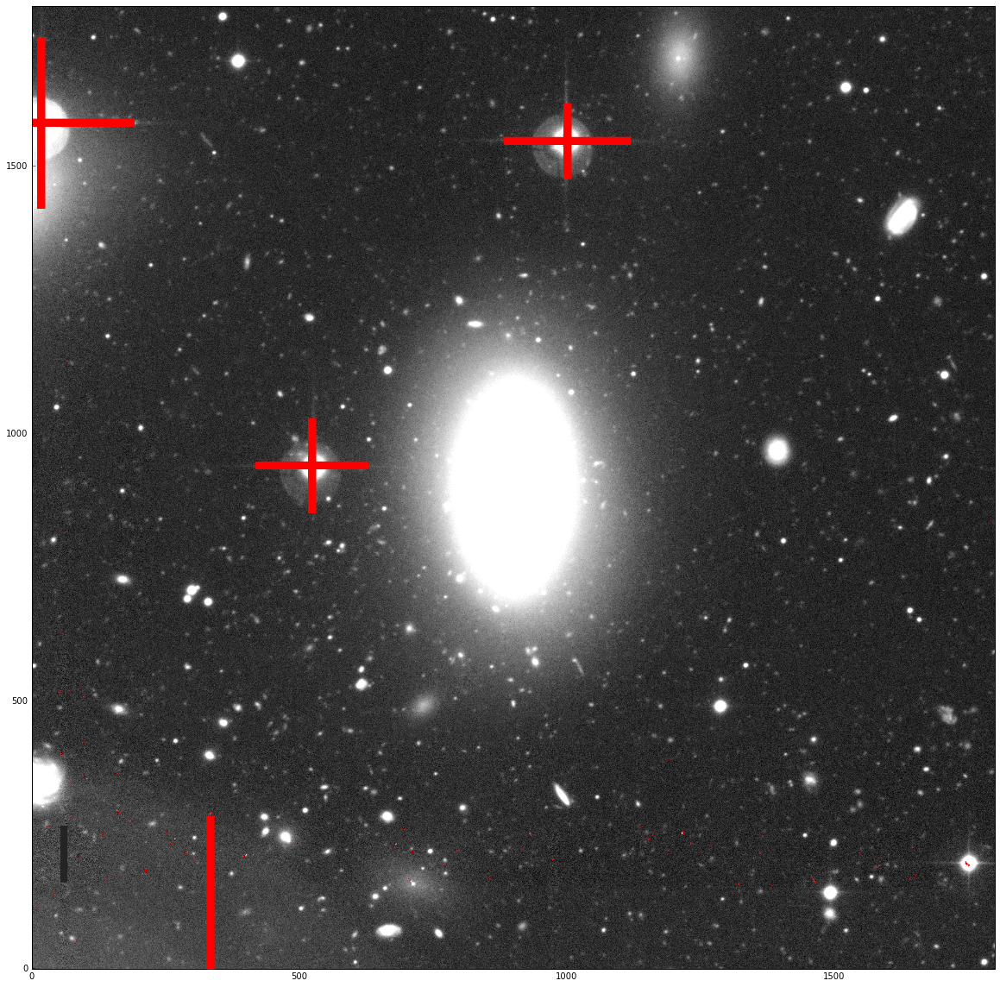

In [69]:
nim_data=im_data.copy()
wim_data=np.ones(im_size)

nim_data[mask_satur]=np.nan
wim_data[mask_satur]=0.

mask_cr, clean = detect_cosmics(nim_data, readnoise=1., gain=1.0, sigclip=3, sigfrac=0.3, objlim=4, satlevel=2500)
im_gray_masked = np.ma.masked_where(np.logical_or(mask_satur,mask_cr), im_gray)
nim_data[mask_cr]=np.nan
wim_data[mask_cr]=0.

nim_file=im_file.replace('.fits','.MASK_ORIG.fits')
fits.writeto(nim_file, nim_data, header=im_h, clobber=True)

wim_file=im_file.replace('.fits','.WEIGHT_ORIG.fits')
fits.writeto(wim_file, wim_data, header=im_h, clobber=True)

#im_gray_masked = np.ma.masked_where(np.logical_or(mask_cr,mask_satur), im_gray)
palette = plt.cm.gray
palette.set_bad('r', 1.0)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(im_gray_masked, cmap=palette, interpolation='bilinear', origin='lower', vmin=0., vmax=0.5)
plt.show()

# SExtractor approach

In [13]:
cmd='sex -d > sex/default.sex'
subprocess.call(cmd,shell=True)
#cmd='cat sex/default.sex'
#print subprocess.check_output(cmd,shell=True)

0

In [14]:
if not os.path.exists("sex"):
    os.makedirs("sex")

file = open("sex/default.conv", 'w')
file.write("CONV NORM\n")
file.write("# 5x5 convolution mask of a gaussian PSF with FWHM = 2.5 pixels.\n")
file.write("0.034673 0.119131 0.179633 0.119131 0.034673\n")
file.write("0.119131 0.409323 0.617200 0.409323 0.119131\n")
file.write("0.179633 0.617200 0.930649 0.617200 0.179633\n")
file.write("0.119131 0.409323 0.617200 0.409323 0.119131\n")
file.write("0.034673 0.119131 0.179633 0.119131 0.034673\n")
file.close()

In [15]:
file = open("sex/default.param", 'w')
file.write("NUMBER                 Running object number                                      \n")
file.write("X_IMAGE                Object position along x                                    [pixel]\n")
file.write("Y_IMAGE                Object position along y                                    [pixel]\n")
file.write("ALPHA_J2000            Right ascension of barycenter (J2000)                      [deg]\n")
file.write("DELTA_J2000            Declination of barycenter (J2000)                          [deg]\n")
file.write("FLUX_APER(1)           # Flux vector within fixed circular aperture(s)            [count]\n")
file.write("FLUXERR_APER(1)        # RMS error vector for aperture flux(es)                   [count]\n")
file.write("FLUX_AUTO              Flux within a Kron-like elliptical aperture                [count]\n")
file.write("FLUXERR_AUTO           RMS error for AUTO flux                                    [count]\n")
file.write("MAG_AUTO               Kron-like elliptical aperture magnitude                    [mag]\n")
file.write("MAGERR_AUTO            RMS error for AUTO magnitude                               [mag]\n")
file.write("KRON_RADIUS            Kron apertures in units of A or B                          \n")
file.write("A_IMAGE                Profile RMS along major axis                               [pixel]\n")
file.write("B_IMAGE                Profile RMS along minor axis                               [pixel]\n")
file.write("THETA_IMAGE            Position angle (CCW/x)                                     [deg]\n")
file.write("ELLIPTICITY            1 - B_IMAGE/A_IMAGE                                        \n")
file.write("FLUX_MAX               Peak flux above background                                 [count]\n")
file.write("FLUX_RADIUS(1)         # Fraction-of-light radii                                  [pixel]\n")
file.write("VIGNET(25,25)          # Pixel data around detection                              [count]\n")
file.write("FLAGS                  Extraction flags                                           \n")
file.close()

In [33]:
sex_im_file=im_file
sex_wim_file=im_file.replace('.fits','.WEIGHT_ORIG.fits')
sex_conf_file='sex/default.sex'
sex_param_file='sex/default.param'
sex_conv_file='sex/default.conv'
sex_detect_thresh='2.'
sex_analysis_thresh='2.'
sex_detect_minarea='3'
sex_deblend_mincont='0.001'
sex_zp='30.'
sex_satur_level='36000'
sex_mem_pixstack='1000000'
sex_cat_type='ASCII_HEAD'
sex_weight_type='MAP_WEIGHT'
sex_back_size='64'
sex_back_filtersize='3'
sex_check_type='BACKGROUND,FILTERED'
sex_check_name=im_file.replace('.fits','.CHECK_BACKGROUND.fits')+','+im_file.replace('.fits','.CHECK_FILTERED.fits')

In [34]:
sex_cat_name=im_file.replace('.fits','.dat')
cmd='sex -c '+sex_conf_file+' -DETECT_THRESH '+sex_detect_thresh+' -DETECT_MINAREA '+sex_detect_minarea+' -ANALYSIS_THRESH '+sex_analysis_thresh+' -DEBLEND_MINCONT '+sex_deblend_mincont+' -BACK_SIZE '+sex_back_size+' -BACK_FILTERSIZE '+sex_back_filtersize+' -PARAMETERS_NAME '+sex_param_file+' -FILTER_NAME '+sex_conv_file+' -CATALOG_TYPE '+sex_cat_type+' -WEIGHT_TYPE '+sex_weight_type+' -MAG_ZEROPOINT '+sex_zp+' -SATUR_LEVEL '+sex_satur_level+' -MEMORY_PIXSTACK '+sex_mem_pixstack+' -CHECKIMAGE_TYPE '+sex_check_type+' -CHECKIMAGE_NAME '+sex_check_name+' -CATALOG_NAME '+sex_cat_name+' -WEIGHT_IMAGE '+sex_wim_file+' '+sex_im_file
cmd_args=shlex.split(cmd)
print cmd
proc = subprocess.Popen(cmd_args,stdout=subprocess.PIPE, stderr=subprocess.PIPE)
stdout, stderr = proc.communicate()
print stderr[0:200]

im_cat_file = im_file.replace('.fits','.dat')
im_cat = ascii.read(im_cat_file, format = "sextractor")  
print im_cat[0:5]

sex -c sex/default.sex -DETECT_THRESH 2. -DETECT_MINAREA 3 -ANALYSIS_THRESH 2. -DEBLEND_MINCONT 0.001 -BACK_SIZE 64 -BACK_FILTERSIZE 3 -PARAMETERS_NAME sex/default.param -FILTER_NAME sex/default.conv -CATALOG_TYPE ASCII_HEAD -WEIGHT_TYPE MAP_WEIGHT -MAG_ZEROPOINT 30. -SATUR_LEVEL 36000 -MEMORY_PIXSTACK 1000000 -CHECKIMAGE_TYPE BACKGROUND,FILTERED -CHECKIMAGE_NAME vcc1010flux.CHECK_BACKGROUND.fits,vcc1010flux.CHECK_FILTERED.fits -CATALOG_NAME vcc1010flux.dat -WEIGHT_IMAGE vcc1010flux.WEIGHT_ORIG.fits vcc1010flux.fits
> 
----- SExtractor 2.19.5 started on 2016-02-22 at 11:46:00 with 1 thread

> Setting catalog parameters
> Reading detection filter
> Initializing check-image(s)
> 
NUMBER  X_IMAGE  Y_IMAGE  ALPHA_J2000 ... VIGNET_622 VIGNET_623 VIGNET_624 FLAGS
          pix      pix                ...     ct         ct         ct          
------ --------- -------- ----------- ... ---------- ---------- ---------- -----
     1 1750.7563 198.6014 186.8192794 ...   4.513466   4.254274   3.87

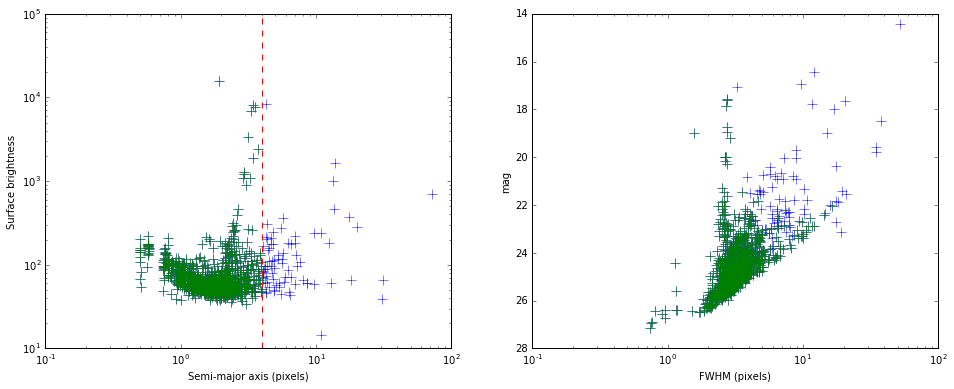

FITS image - min=-1.33  max=57.38


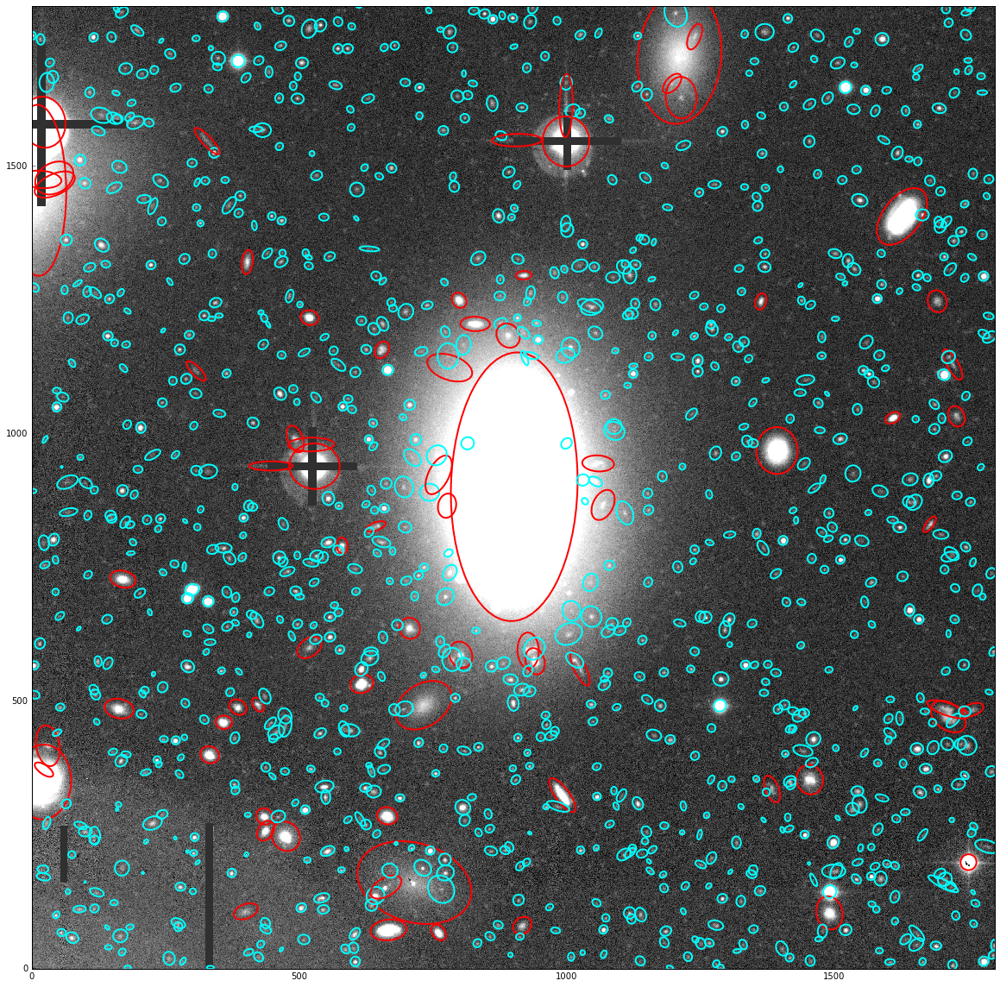

In [46]:
gv=(im_cat["FLAGS"] >= 0)

ra = np.array(im_cat["ALPHA_J2000"][gv])
dec = np.array(im_cat["DELTA_J2000"][gv])
flux = np.array(im_cat["FLUX_AUTO"][gv])
mag = np.array(im_cat["MAG_AUTO"][gv])
fwhm = np.array(im_cat["FLUX_RADIUS"][gv])
ellip = np.array(im_cat["ELLIPTICITY"][gv])
theta = np.array(im_cat["THETA_IMAGE"][gv])
x_image = np.array(im_cat["X_IMAGE"][gv])
y_image = np.array(im_cat["Y_IMAGE"][gv])
kron_radius = np.array(im_cat["KRON_RADIUS"][gv])
a_image = np.array(im_cat["A_IMAGE"][gv])
b_image = np.array(im_cat["B_IMAGE"][gv])

knn_a_range=[0,4]
gv=np.logical_and(a_image>knn_a_range[0], a_image<knn_a_range[1])

fig, ax = plt.subplots(1,2,figsize=(16, 6))

ax[0].plot(a_image, flux/(a_image*b_image),'+', markersize=10)
ax[0].plot(a_image[gv], (flux/(a_image*b_image))[gv],'+', markersize=10, color='g')
ax[0].axvline(x=knn_a_range[1],color='r',ls='dashed')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('Semi-major axis (pixels)')
ax[0].set_ylabel('Surface brightness')

ax[1].plot(fwhm, mag,'+', markersize=10)
ax[1].plot(fwhm[gv], mag[gv],'+', markersize=10, color='g')
ax[1].set_xscale('log')
ax[1].invert_yaxis()
ax[1].set_xlabel('FWHM (pixels)')
ax[1].set_ylabel('mag')
plt.show()

nim_mask=(mask_cr | mask_satur)
nim_data=im_data.copy()
nim_data[nim_mask]=0.
nim_gray=imtoasinh(nim_data)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(nim_gray, plt.get_cmap('gray'), interpolation='nearest', origin='lower', vmin=0., vmax=0.5)
for i in range(len(x_image)):
    if a_image[i]<mask_radius_limit:
        ellipse = Ellipse(xy=(x_image[i], y_image[i]), width=2*kron_radius[i]*a_image[i], height=2*kron_radius[i]*b_image[i], angle = theta[i], edgecolor='cyan', fc='None', lw=2)
    else:
        ellipse = Ellipse(xy=(x_image[i], y_image[i]), width=2*kron_radius[i]*a_image[i], height=2*kron_radius[i]*b_image[i], angle = theta[i], edgecolor='red', fc='None', lw=2)
    ax.add_patch(ellipse)
plt.show()

FITS image - min=-1.33  max=54.64


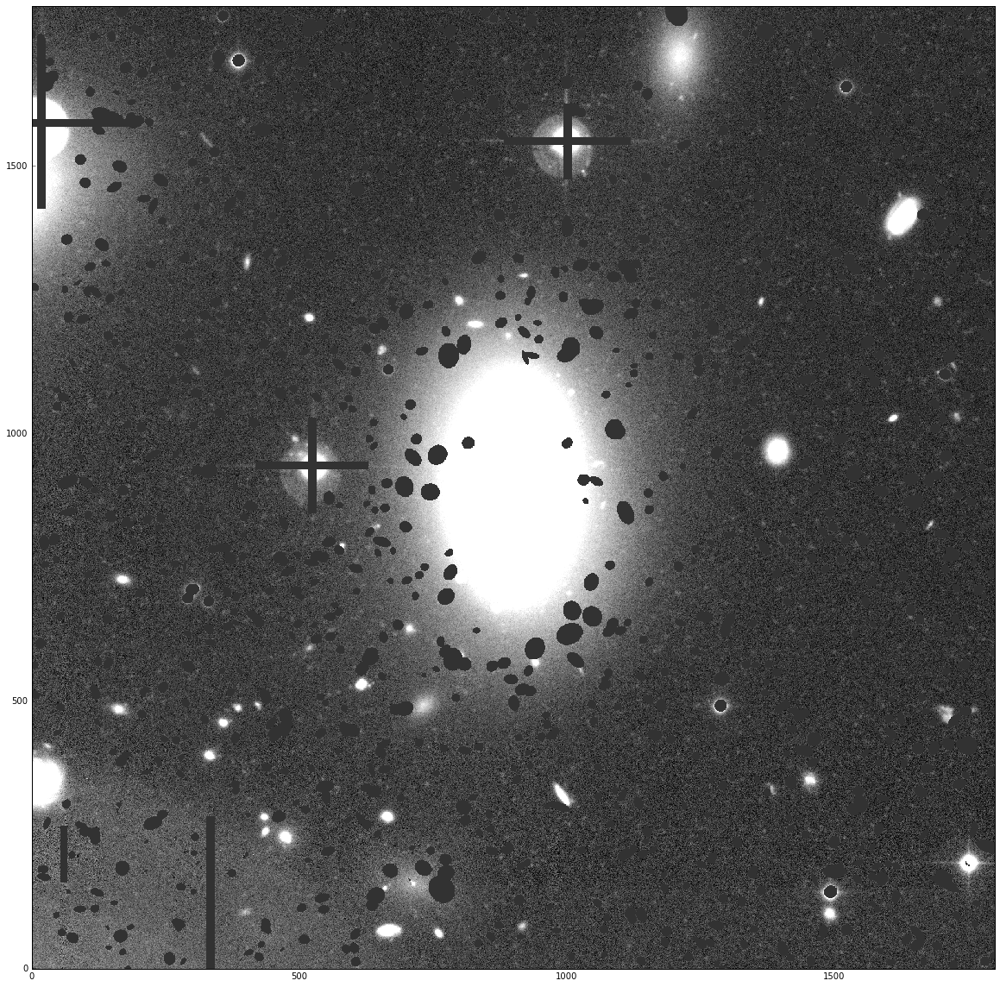

In [71]:
im_mask=(mask_cr | mask_satur)
nim_data=im_data.copy()
nim_data[im_mask]=np.nan

#nim_file=im_file.replace('.fits','.MASK_ORIG.fits')
#nim_data=fits.getdata(nim_file,0)

gv=np.ravel(np.where(np.logical_and(a_image>knn_a_range[0], a_image<knn_a_range[1])))
ny,nx = im_size
mask_source=np.zeros(im_size, bool)

for i in range(len(gv)):
    h,k = (x_image[gv[i]], y_image[gv[i]])
    a,b = (kron_radius[gv[i]]*a_image[gv[i]], kron_radius[gv[i]]*b_image[gv[i]])
    angle=theta[gv[i]]*np.pi/180
    y,x = np.ogrid[-k:ny-k,-h:nx-h]
    mask = (x*np.cos(angle)+y*np.sin(angle))**2/a**2 + (x*np.sin(angle)-y*np.cos(angle))**2/b**2  <= 1
    mask_source[mask]=True
    nim_data[mask]=np.nan

im_gray=imtoasinh(nim_data)
    
palette = plt.cm.gray
palette.set_bad('black', 1.0)
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(im_gray,cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=0., vmax=0.5)
plt.show()

Processing image xrange:  [0, 300]
Processing image yrange:  [0, 300]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.4 minutes
Processing image xrange:  [0, 300]
Processing image yrange:  [300, 600]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.6 minutes
Processing image xrange:  [0, 300]
Processing image yrange:  [600, 900]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.6 minutes
Processing image xrange:  [0, 300]
Processing image yrange:  [900, 1200]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.6 minutes
Processing image xrange:  [0, 300]
Processing image yrange:  [1200, 1500]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.6 minutes
Processing image xrange:  [0, 300]
Processing image yrange:  [1500, 1800]
RBF tps interpolation - STARTING
Interpolation done
Total execution time: 0.3 minutes
Processing image xrange:  [300, 600]
Processing i

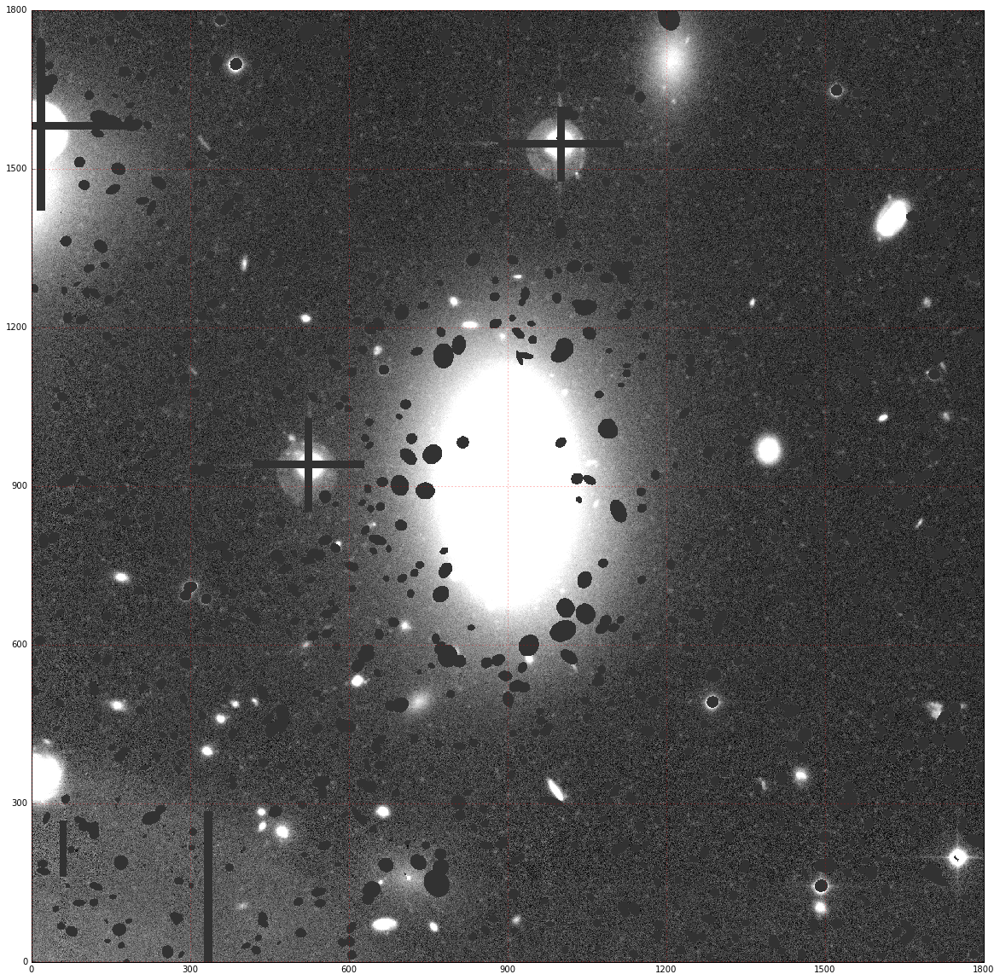

FITS image - min=-0.19  max=56.73


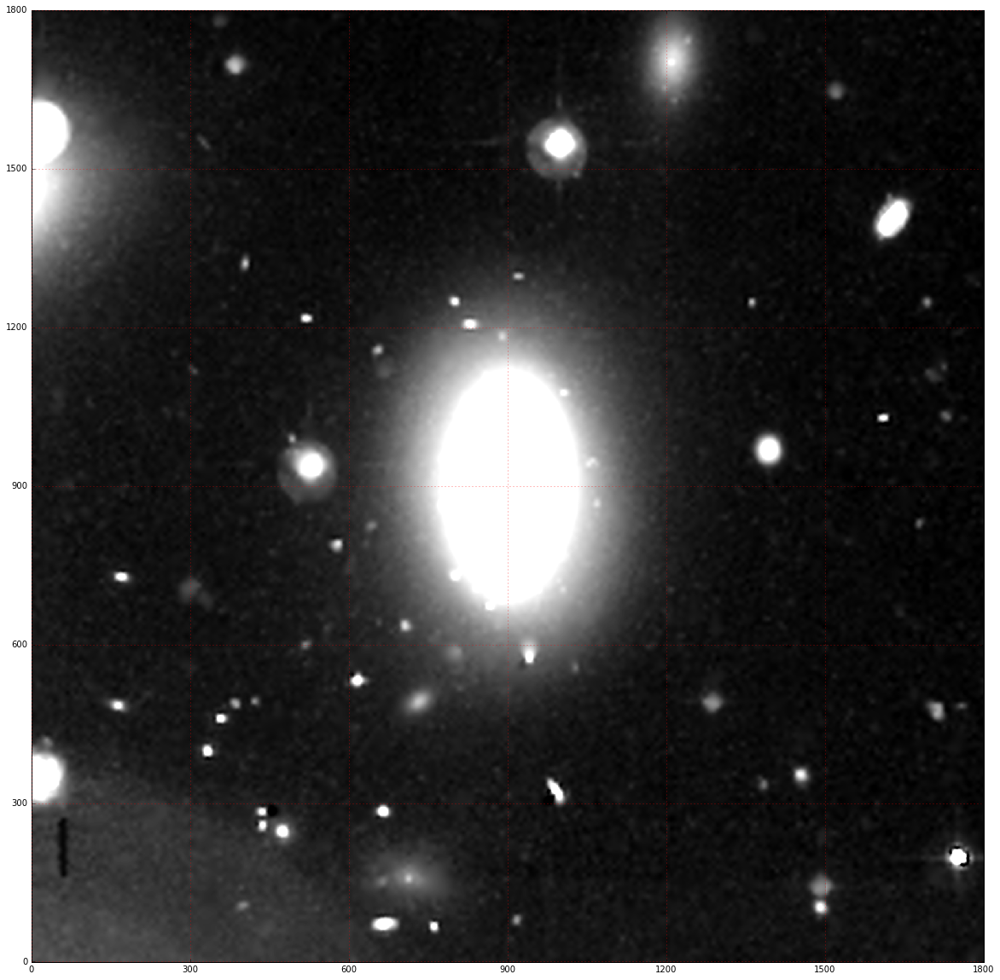

In [72]:
im_mask=(mask_cr | mask_satur | mask_source)

#nim_data,nim_model_data=median_filter(im_data[:,800:1200], im_mask[:,800:1200], inter_type='cubic', inter_width=32)
#nim_data,nim_model_data=median_filter(im_data[:,800:1200], im_mask[:,800:1200], inter_type='inverse', inter_width=32)
#im_model_data=median_interpolate(im_data[:,700:1100], im_mask[:,700:1100], inter_type='multiquadric', inter_width=16)
# nim_data[:,], nim_model_data=median_interpolate(im_data[:,700:1300], im_mask[:,700:1300], inter_type='tps', inter_width=16, grid_sampling=1)
nim_data = np.zeros(im_size)
nim_model_data = np.zeros(im_size)

im_step=300
im_overlap=100
im_xrange=np.append(np.arange(0,im_size[1],im_step),im_size[1])
im_yrange=np.append(np.arange(0,im_size[0],im_step),im_size[0])
for i in range(len(im_xrange)-1):
    for j in range(len(im_yrange)-1):
        x_in=[np.max([0,im_xrange[i]-im_overlap]),np.min([im_size[1],im_xrange[i+1]+im_overlap])]
        y_in=[np.max([0,im_yrange[j]-im_overlap]),np.min([im_size[0],im_yrange[j+1]+im_overlap])]
        x_out=[im_xrange[i],im_xrange[i+1]]
        y_out=[im_yrange[j],im_yrange[j+1]]
        print "Processing image xrange: ", x_out
        print "Processing image yrange: ", y_out
        temp_im, temp_model =median_interpolate(im_data[y_in[0]:y_in[1],x_in[0]:x_in[1]], im_mask[y_in[0]:y_in[1],x_in[0]:x_in[1]], inter_type='tps', inter_width=8, grid_sampling=1)
        nim_data[y_out[0]:y_out[1],x_out[0]:x_out[1]]=temp_im[y_out[0]-y_in[0]:y_out[0]-y_in[0]+im_step,x_out[0]-x_in[0]:x_out[0]-x_in[0]+im_step]
        nim_model_data[y_out[0]:y_out[1],x_out[0]:x_out[1]]=temp_model[y_out[0]-y_in[0]:y_out[0]-y_in[0]+im_step,x_out[0]-x_in[0]:x_out[0]-x_in[0]+im_step]

im_gray=imtoasinh(nim_data)
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(im_gray,cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=0., vmax=0.5)
ax.set_xticks(np.arange(0,im_size[0]+1,im_step))
ax.set_yticks(np.arange(0,im_size[1]+1,im_step))
plt.grid(color='r')
plt.show()

im_gray=imtoasinh(nim_model_data)
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(im_gray,cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=0., vmax=0.5)
ax.set_xticks(np.arange(0,im_size[0]+1,im_step))
ax.set_yticks(np.arange(0,im_size[1]+1,im_step))
plt.grid(color='r')
plt.show()

FITS image - min=-2.10  max=6.62


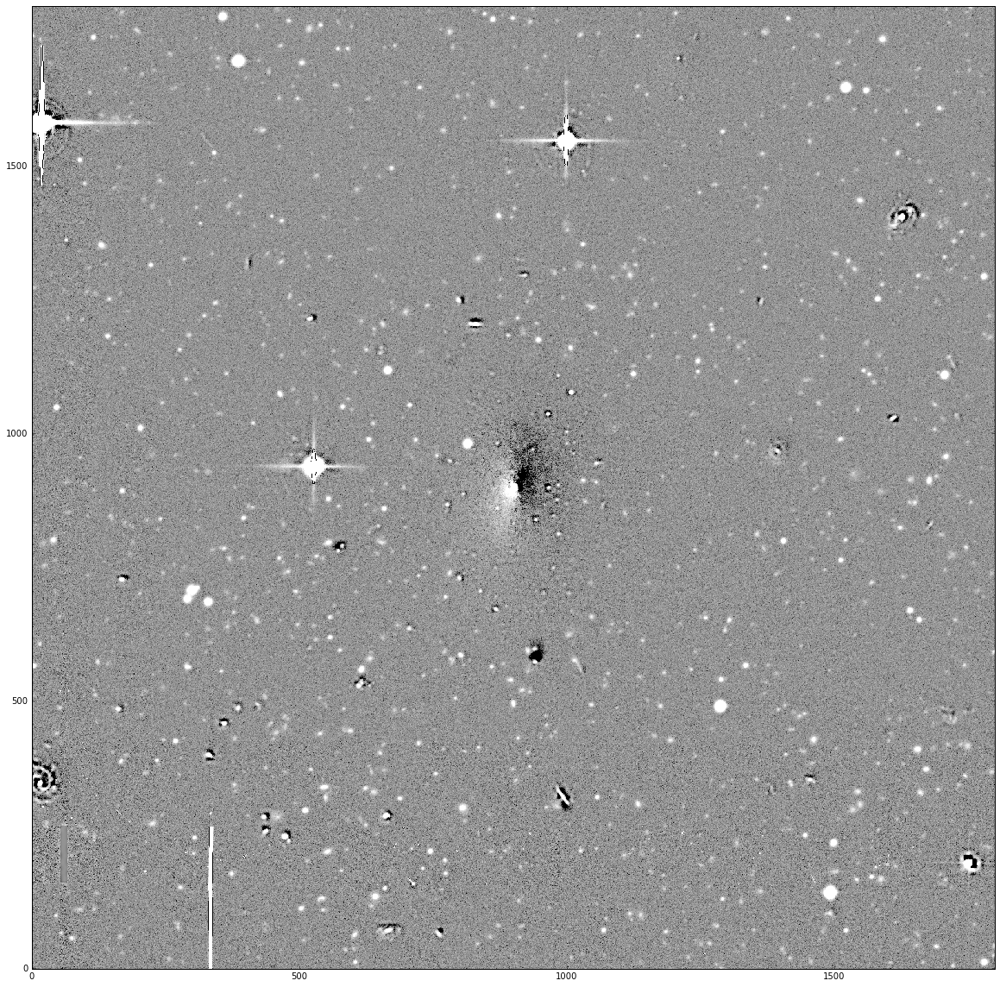

In [73]:
ss_file=im_file.replace('.fits','.SKY_SUBTRACTED.fits')
ss_data=im_data-nim_model_data
fits.writeto(ss_file, ss_data, header=im_h, clobber=True)

im_gray=imtoasinh(ss_data)
fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(im_gray,cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=0., vmax=1.)
plt.show()

#OLD

# Laplacian of Gaussian approach


nim_file=im_file.replace('.fits','.MASK_ORIG.fits')
nim_data=fits.getdata(nim_file,0)
nim_gray=np.ma.filled(im_gray_masked,0.)

start_time = time.time()
blobs_log = blob_log(nim_gray, min_sigma=2., max_sigma=300, num_sigma=30, threshold=.05, log_scale=True)
print "Number of detected sources: %d" % len(blobs_log)
print "Total execution time: %.1f minutes" % ((time.time() - start_time)/60.)

blob_x=blobs_log[:,1]
blob_y=blobs_log[:,0]
blob_radius=blobs_log[:,2]*sqrt(2)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(nim_gray, plt.get_cmap('gray'), interpolation='nearest', origin='lower', vmin=0., vmax=0.5)
for i in range(len(blob_x)):
    circle = plt.Circle((blob_x[i], blob_y[i]), blob_radius[i], color='yellow', linewidth=1, fill=False)
    ax.add_patch(circle)
plt.show()

gv_sort=np.argsort(blob_radius)
blob_mask_percentile=0.9
blob_mask_factor=2.

xx=[]
yy=[]
zz=[]
ny,nx = im_size
for i in range(0,np.fix(len(blob_x)*blob_mask_percentile)):
    a,b = (blob_y[gv_sort][i], blob_x[gv_sort][i])
    y,x = np.ogrid[-a:ny-a,-b:nx-b]
    mask = x**2 + y**2 <= (blob_mask_factor*blob_radius[gv_sort][i])**2
    nim_data[mask]=np.nan
    
for i in range(np.fix(len(blob_x)*blob_mask_percentile),len(blob_x)):
    x=blob_x[gv_sort][i]
    y=blob_y[gv_sort][i]
    xx.append(x)
    yy.append(y)
    zz.append( np.nanmedian(nim_data[y-1:y+2,x-1:x+2]) )

points = np.random.rand(10000, 2)
x=np.round(points[:,0]*im_size[1]).astype(int)
y=np.round(points[:,1]*im_size[0]).astype(int)
for i in range(len(x)):
    xx.append(x[i])
    yy.append(y[i])
    zz.append( np.nanmedian(nim_data[y[i]-1:y[i]+2,x[i]-1:x[i]+2]) )

xx=np.array(xx)
yy=np.array(yy)
zz=np.array(zz)
    
nim_file=im_file.replace('.fits','.MASK_LOG.fits')
fits.writeto(nim_file, nim_data, header=im_h, clobber=True)

fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(nim_gray, plt.get_cmap('gray'), interpolation='nearest', origin='lower', vmin=0., vmax=0.5)
for i in range(len(blob_x)):
    if i<np.fix(len(blob_x)*blob_mask_percentile):
        circle = plt.Circle((blob_x[gv_sort][i], blob_y[gv_sort][i]), blob_mask_factor*blob_radius[gv_sort][i], color='red', linewidth=1, fill=True)
    else:
        circle = plt.Circle((blob_x[gv_sort][i], blob_y[gv_sort][i]), blob_radius[gv_sort][i], color='yellow', linewidth=1, fill=False)
    ax.add_patch(circle)

nim_median_data=signal.medfilt2d(nim_data,kernel_size=5)

palette = plt.cm.gray
palette.set_bad('black', 1.0)

fig, ax = plt.subplots(figsize=(20, 20))
im = ax.imshow(np.arcsinh(nim_median_data),cmap=plt.get_cmap('gray'), interpolation='nearest', origin='lower',
               vmin=np.arcsinh(im_median-2*im_stddev), vmax=np.arcsinh(im_median+10*im_stddev))
fig.colorbar(im)
plt.show()